In [1]:
import os
import shutil
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from lightgbm.sklearn import LGBMClassifier

from sklearn.model_selection import StratifiedKFold, cross_val_predict
from sklearn.metrics import classification_report, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

In [2]:
consump_df = pd.read_csv('../data/CS/Hubballi_Dhaward_Water_Consumption_Nightlight_Population.csv')

feature_df = pd.read_csv('../outputs/segmentation_result_cleaned.csv')
print("Number of HHs with availabel SVI:", feature_df.shape[0])

building_df = pd.read_csv('../data/CS/Hubballi_CS_building.csv') 

# Drop rows with missing building height
#building_df = building_df.dropna(subset=['building_height'])

cs_building_df = pd.merge(consump_df, building_df, on='sl_no', how='left')
print("Number of HHs with in Customer Survey:", cs_building_df.shape[0])

df = pd.merge(feature_df, cs_building_df, on='sl_no', how='left')
print("Number of HHs with both CS and SVI:", df.shape[0])

Number of HHs with availabel SVI: 28114
Number of HHs with in Customer Survey: 35980
Number of HHs with both CS and SVI: 28114


In [3]:
# Merge datasets
cs_building_df = pd.merge(consump_df, building_df, on='sl_no', how='left')
df = pd.merge(feature_df, cs_building_df, on='sl_no', how='left')

# Drop rows with missing values in 'permonthunitskl' before binning
df = df.dropna(subset=['permonthunitskl']).reset_index(drop=True)

# Create bins for the water consumption classes
bins = [0, 8, 15, 25, float('inf')]
labels = ['0-8', '8-15', '15-25', '>25']
df['Target'] = pd.cut(df['permonthunitskl'], bins=bins, labels=labels, right=False)

# Drop rows with missing values in the 'Target' column
df = df.dropna(subset=['Target']).reset_index(drop=True)

# Convert target labels to numeric values
label_mapping = {'0-8': 0, '8-15': 1, '15-25': 2, '>25': 3}
df['Target'] = df['Target'].map(label_mapping)

In [4]:
# Split the data into training and testing sets
train_df, test_df = train_test_split(df, test_size=0.2, random_state=123, shuffle=True, stratify=df['Target'])
train_df.shape

(15273, 96)

In [5]:
train_df['Target'].value_counts()

Target
3    7314
2    3988
1    2655
0    1316
Name: count, dtype: int64

## Training Models
### Image Segmentation Features + ML

In [6]:
from sklearn.base import clone, BaseEstimator, ClassifierMixin
from sklearn.utils.validation import check_X_y, check_is_fitted, check_array
from sklearn.utils.multiclass import check_classification_targets

class OrdinalClassifier(BaseEstimator, ClassifierMixin):
    #https://towardsdatascience.com/simple-trick-to-train-an-ordinal-regression-with-any-classifier-6911183d2a3c
    """
    A classifier that can be trained on a range of classes.
    @param classifier: A scikit-learn classifier.
    """
    def __init__(self, clf):
        self.clf = clf
        self.clfs = {}
        self.classes_ = None  # Add this to store the classes

    def fit(self, X, y, **kwargs):
        # Store the classes
        self.classes_ = np.sort(np.unique(y))
        self.uniques_class = self.classes_

        if self.uniques_class.shape[0] > 2:
            for i in range(self.uniques_class.shape[0] - 1):
                binary_y = (y > self.uniques_class[i]).astype(np.uint8)
                clf = clone(self.clf)
                clf.fit(X, binary_y, **kwargs)
                self.clfs[i] = clf

    def predict(self, X):
        return np.argmax(self.predict_proba(X), axis=1)

    def predict_proba(self, X):
        h = [self.clfs[k].predict_proba(X)[:, 1].reshape(-1, 1) for k in self.clfs]

        p_x_first = 1 - h[0]
        p_x_last = h[-1]
        p_x_middle = [h[i] - h[i + 1] for i in range(len(h) - 1)]

        probs = np.hstack([p_x_first, *p_x_middle, p_x_last])
        return probs


In [7]:
def cross_val_evaluate_model(model, features, labels, cv, class_labels):

    # Create a StratifiedKFold object
    stratified_kfold = StratifiedKFold(n_splits=cv, shuffle=True, random_state=123)

    # Cross-validation predictions with stratification
    preds = cross_val_predict(model, features, labels, cv=stratified_kfold, method='predict')
    probs = cross_val_predict(model, features, labels, cv=stratified_kfold, method='predict_proba')

    # Classification report
    print(classification_report(labels, preds, target_names=class_labels))

    # Calculate ROC-AUC score
    y_true = pd.get_dummies(labels).values
    y_pred = pd.DataFrame(probs, columns=class_labels).values
    roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr')
    print(f"ROC-AUC Score: {roc_auc}")

    # ROC Curve for each class
    fpr = {}
    tpr = {}
    roc_auc_dict = {}

    for i, label in enumerate(class_labels):
        fpr[label], tpr[label], _ = roc_curve(y_true[:, i], y_pred[:, i])
        roc_auc_dict[label] = auc(fpr[label], tpr[label])

    plt.figure()
    for label in class_labels:
        plt.plot(fpr[label], tpr[label], label=f'{label} (AUC = {roc_auc_dict[label]:.2f})')
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Each Class')
    plt.legend(loc="lower right")
    plt.show()

# Labels for classification
labels = ['0-8KL', '8-15KL', '15-25KL', '>25KL']


Original training set size: (15273, 54), (15273,)
Balanced training set size: (29256, 54), (29256,)
Ordinal Logistic Regression Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.30      0.35      0.32      7314
      8-15KL       0.29      0.32      0.30      7314
     15-25KL       0.27      0.12      0.17      7314
       >25KL       0.32      0.39      0.35      7314

    accuracy                           0.30     29256
   macro avg       0.29      0.30      0.29     29256
weighted avg       0.29      0.30      0.29     29256

ROC-AUC Score: 0.5583542666004369


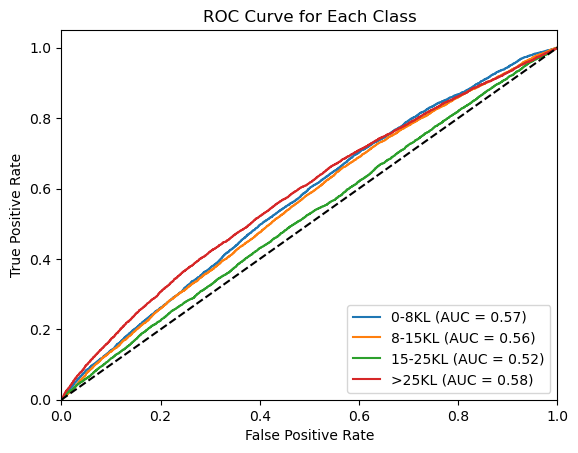

Ordinal Random Forest Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.59      0.67      0.63      7314
      8-15KL       0.53      0.50      0.51      7314
     15-25KL       0.47      0.32      0.38      7314
       >25KL       0.46      0.57      0.51      7314

    accuracy                           0.52     29256
   macro avg       0.51      0.52      0.51     29256
weighted avg       0.51      0.52      0.51     29256

ROC-AUC Score: 0.7609685939118038


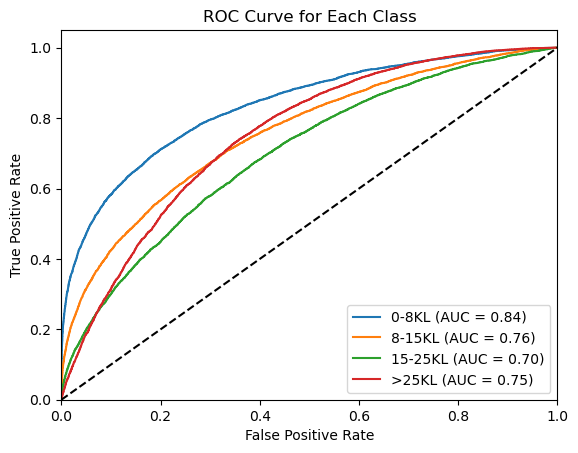

Ordinal Gradient Boosting Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.49      0.54      0.52      7314
      8-15KL       0.38      0.36      0.37      7314
     15-25KL       0.34      0.24      0.28      7314
       >25KL       0.43      0.55      0.48      7314

    accuracy                           0.42     29256
   macro avg       0.41      0.42      0.41     29256
weighted avg       0.41      0.42      0.41     29256

ROC-AUC Score: 0.6831865876695283


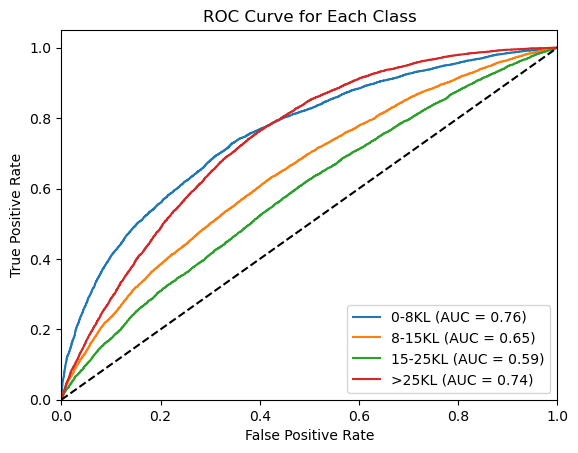

Ordinal LightGBM Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.69      0.67      0.68      7314
      8-15KL       0.50      0.53      0.52      7314
     15-25KL       0.44      0.37      0.40      7314
       >25KL       0.48      0.53      0.50      7314

    accuracy                           0.53     29256
   macro avg       0.53      0.53      0.53     29256
weighted avg       0.53      0.53      0.53     29256

ROC-AUC Score: 0.7722086498232457


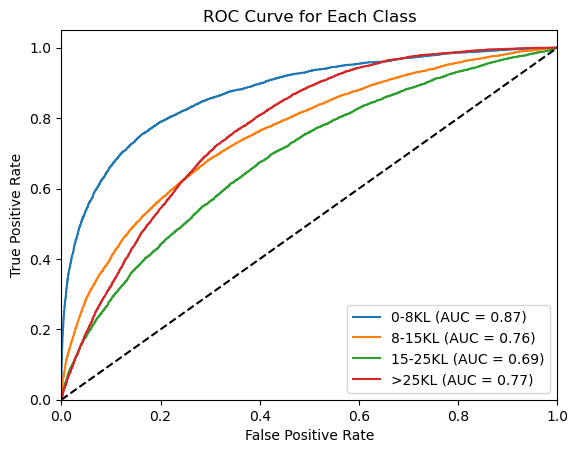

In [8]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.utils.class_weight import compute_class_weight
from imblearn.over_sampling import SMOTE

# Filter out 'sl_no' and 'name' columns
segmentation_columns = [col for col in feature_df.columns if col not in ['sl_no', 'name']]

# Filter the DataFrame to include segmentation columns
filtered_df = train_df[segmentation_columns]

# Ensure all data in `filtered_df` is numeric (just in case)
filtered_df = filtered_df.apply(pd.to_numeric, errors='coerce')

# Handle missing values by imputing with the median
imputer = SimpleImputer(strategy='median')
filtered_df = pd.DataFrame(imputer.fit_transform(filtered_df), columns=segmentation_columns)

# Standardize the segmentation columns
scaler = StandardScaler()
segmentation_scaled = scaler.fit_transform(filtered_df)

# Prepare target labels for training
train_labels = train_df['Target'].values

# Apply SMOTE to balance the training dataset
smote = SMOTE(random_state=123)
X_train_balanced, y_train_balanced = smote.fit_resample(segmentation_scaled, train_labels)

print(f"Original training set size: {segmentation_scaled.shape}, {train_labels.shape}")
print(f"Balanced training set size: {X_train_balanced.shape}, {y_train_balanced.shape}")

# Train and evaluate the ordinal logistic regression model
print("Ordinal Logistic Regression Model with Over-Sampling")
ordinal_logistic_model = OrdinalClassifier(clf=LogisticRegression(max_iter=1000, multi_class='ovr', solver='lbfgs'))
cross_val_evaluate_model(ordinal_logistic_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)

# Train and evaluate the ordinal random forest model
print("Ordinal Random Forest Model with Over-Sampling")
ordinal_rf_model = OrdinalClassifier(clf=RandomForestClassifier(n_estimators=100, max_depth=10, random_state=123))
cross_val_evaluate_model(ordinal_rf_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)

# Train and evaluate the ordinal gradient boost model
print("Ordinal Gradient Boosting Model with Over-Sampling")
ordinal_gb_model = OrdinalClassifier(clf=GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=123))
cross_val_evaluate_model(ordinal_gb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)

# Train and evaluate the ordinal LightGBM model
print("Ordinal LightGBM Model with Over-Sampling")
ordinal_lgb_model = OrdinalClassifier(clf=LGBMClassifier(objective='binary', max_depth=10, random_state=123, learning_rate=0.1, verbosity=-1, n_jobs=-1))
cross_val_evaluate_model(ordinal_lgb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)


Original training set size: (15273, 71), (15273,)
Balanced training set size: (29256, 71), (29256,)
Ordinal Logistic Regression Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.33      0.33      0.33      7314
      8-15KL       0.30      0.28      0.29      7314
     15-25KL       0.28      0.13      0.18      7314
       >25KL       0.34      0.54      0.42      7314

    accuracy                           0.32     29256
   macro avg       0.32      0.32      0.31     29256
weighted avg       0.32      0.32      0.31     29256

ROC-AUC Score: 0.5882353378273948


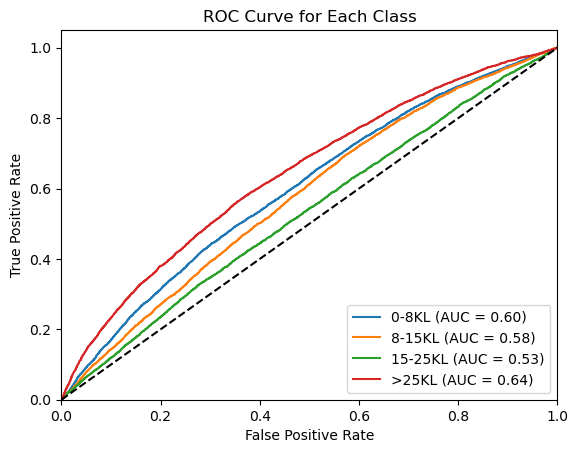

Ordinal Random Forest Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.65      0.69      0.67      7314
      8-15KL       0.56      0.54      0.55      7314
     15-25KL       0.48      0.33      0.39      7314
       >25KL       0.49      0.64      0.56      7314

    accuracy                           0.55     29256
   macro avg       0.55      0.55      0.54     29256
weighted avg       0.55      0.55      0.54     29256

ROC-AUC Score: 0.7841542115768105


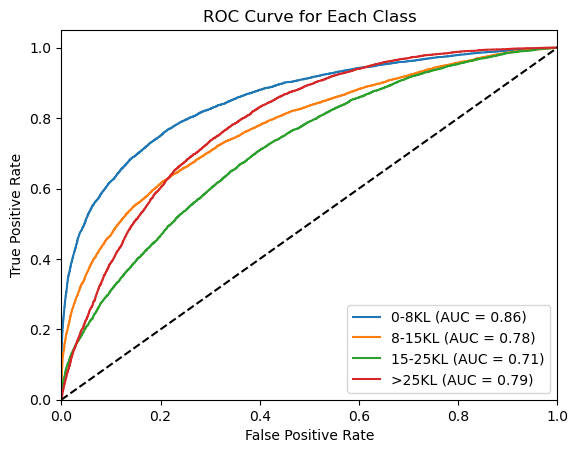

Ordinal Gradient Boosting Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.52      0.55      0.53      7314
      8-15KL       0.41      0.38      0.39      7314
     15-25KL       0.35      0.26      0.30      7314
       >25KL       0.48      0.60      0.53      7314

    accuracy                           0.45     29256
   macro avg       0.44      0.45      0.44     29256
weighted avg       0.44      0.45      0.44     29256

ROC-AUC Score: 0.7062739376204156


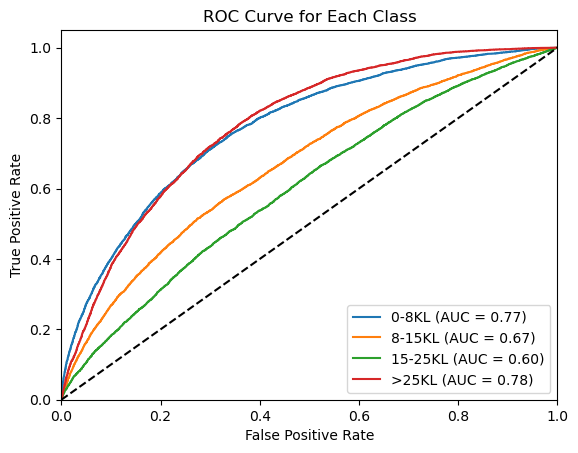

Ordinal LightGBM Model with Over-Sampling
              precision    recall  f1-score   support

       0-8KL       0.70      0.69      0.69      7314
      8-15KL       0.52      0.54      0.53      7314
     15-25KL       0.45      0.38      0.42      7314
       >25KL       0.52      0.58      0.55      7314

    accuracy                           0.55     29256
   macro avg       0.55      0.55      0.55     29256
weighted avg       0.55      0.55      0.55     29256

ROC-AUC Score: 0.7899174868678946


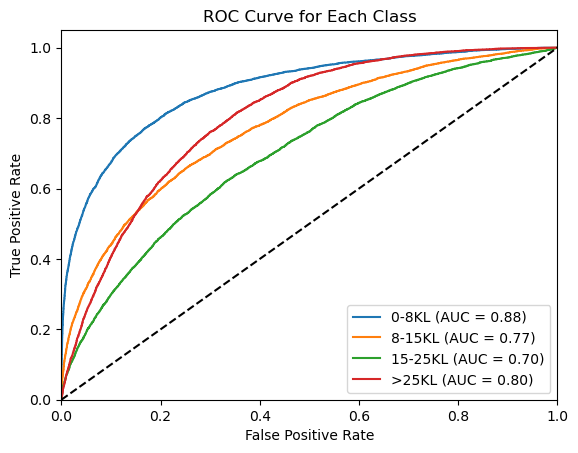

In [9]:
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
import numpy as np

# Compute the new feature: building_square_footage
train_df['builtup_area'] = pd.to_numeric(train_df['building_area'], errors='coerce')
train_df['building_height'] = pd.to_numeric(train_df['building_height'], errors='coerce')

# Compute the new feature: building_square_footage
train_df['building_square_footage'] = train_df['building_area'] * (train_df['building_height'] / 2.5)

# Drop 'sl_no' and 'name' columns from segmentation results
segmentation_columns = [col for col in feature_df.columns if col not in ['sl_no', 'name']]

# One-Hot Encode 'dma' feature
encoder = OneHotEncoder(drop='first', sparse_output=False)
dma_encoded = encoder.fit_transform(train_df[['dma']])

# Create pipelines for population, nightlight, and building_square_footage transformations
pipeline_population = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values with the median
    ('scaler', StandardScaler())  # Standardize the data
])

pipeline_nightlight = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values with the median
    ('scaler', StandardScaler())  # Standardize the data
])

pipeline_square_footage = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),  # Impute missing values with the median
    ('scaler', StandardScaler())  # Standardize the data
])

# Apply transformations
population_scaled = pipeline_population.fit_transform(train_df[['population']])
nightlight_scaled = pipeline_nightlight.fit_transform(train_df[['nightlight']])
square_footage_scaled = pipeline_square_footage.fit_transform(train_df[['building_square_footage']])

# Reset the index of train_df to ensure alignment
train_df = train_df.reset_index(drop=True)
test_df = test_df.reset_index(drop=True)

# Filter the DataFrame to include segmentation columns
filtered_df = train_df[segmentation_columns]

# Ensure all data in `filtered_df` is numeric and handle missing values
filtered_df = filtered_df.apply(pd.to_numeric, errors='coerce')
imputer = SimpleImputer(strategy='median')  # Impute missing values with the median
filtered_df = pd.DataFrame(imputer.fit_transform(filtered_df), columns=segmentation_columns)

# Combine all features: segmentation results, dma, population, nightlight, and building_square_footage
features_combined = np.hstack((
    filtered_df.values,
    dma_encoded,
    population_scaled,
    nightlight_scaled,
    square_footage_scaled
))

# Apply SMOTE to balance the training dataset
smote = SMOTE(random_state=123)
X_train_balanced, y_train_balanced = smote.fit_resample(features_combined, train_labels)

print(f"Original training set size: {features_combined.shape}, {train_labels.shape}")
print(f"Balanced training set size: {X_train_balanced.shape}, {y_train_balanced.shape}")

# Train and evaluate the ordinal logistic regression model
print("Ordinal Logistic Regression Model with Over-Sampling")
ordinal_logistic_model = OrdinalClassifier(clf=LogisticRegression(max_iter=1000, multi_class='ovr', solver='lbfgs'))
cross_val_evaluate_model(ordinal_logistic_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)

# Train and evaluate the ordinal random forest model
print("Ordinal Random Forest Model with Over-Sampling")
ordinal_rf_model = OrdinalClassifier(clf=RandomForestClassifier(n_estimators=100, max_depth=10, random_state=123))
cross_val_evaluate_model(ordinal_rf_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)

# Train and evaluate the ordinal gradient boost model
print("Ordinal Gradient Boosting Model with Over-Sampling")
ordinal_gb_model = OrdinalClassifier(clf=GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, random_state=123))
cross_val_evaluate_model(ordinal_gb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)

# Train and evaluate the ordinal LightGBM model
print("Ordinal LightGBM Model with Over-Sampling")
ordinal_lgb_model = OrdinalClassifier(clf=LGBMClassifier(objective='binary', max_depth=10, random_state=123, learning_rate=0.1, verbosity=-1, n_jobs=-1))
cross_val_evaluate_model(ordinal_lgb_model, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)


### Hyperparametric Tuning

Fitting 5 folds for each of 128 candidates, totalling 640 fits
Best parameters: {'clf__colsample_bytree': 1.0, 'clf__learning_rate': 0.1, 'clf__max_depth': 15, 'clf__min_child_samples': 20, 'clf__n_estimators': 150, 'clf__num_leaves': 40, 'clf__subsample': 0.8}
Best accuracy score: 0.590345791530924
              precision    recall  f1-score   support

       0-8KL       0.80      0.75      0.78      7314
      8-15KL       0.58      0.63      0.60      7314
     15-25KL       0.50      0.46      0.48      7314
       >25KL       0.55      0.57      0.56      7314

    accuracy                           0.61     29256
   macro avg       0.61      0.61      0.61     29256
weighted avg       0.61      0.61      0.61     29256

ROC-AUC Score: 0.8268467357587547


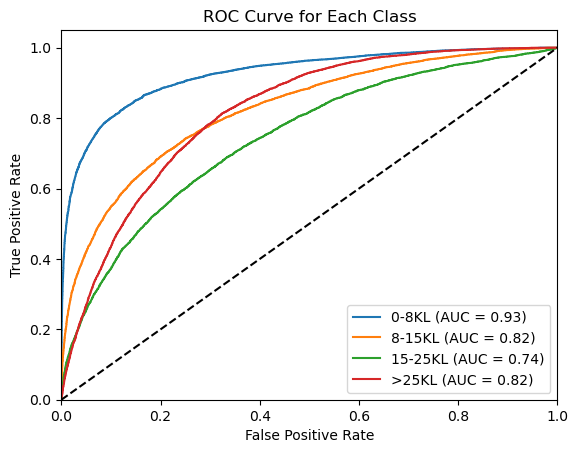

In [10]:
from sklearn.model_selection import GridSearchCV

# Define the parameter grid for LightGBM
param_grid = {
    'clf__n_estimators': [100, 150],
    'clf__max_depth': [10, 15],
    'clf__learning_rate': [0.05, 0.1],
    'clf__num_leaves': [20, 40], 
    'clf__min_child_samples': [10, 20],
    'clf__subsample': [0.8, 1.0],
    'clf__colsample_bytree': [0.8, 1.0],
}

# Initialize the OrdinalClassifier with a base LightGBM model
ordinal_lgb = OrdinalClassifier(
    clf=LGBMClassifier(
        objective='binary',  # Will be used in binary splits inside the wrapper
        random_state=123,
        verbosity=-1,
        n_jobs=-1
    )
)

# Create the GridSearchCV
grid_search = GridSearchCV(
    estimator=ordinal_lgb,
    param_grid=param_grid,
    scoring={
        'accuracy': 'accuracy',
        'roc_auc': 'roc_auc_ovr'
    },
    refit='accuracy',  # Refit using the best accuracy model
    cv=5,
    n_jobs=-1,
    verbose=2
)

# Fit to training data
grid_search.fit(X_train_balanced, y_train_balanced)

# Print best parameters and score
print("Best parameters:", grid_search.best_params_)
print("Best accuracy score:", grid_search.best_score_)


# Retrieve best estimator and evaluate
best_ordinal_lgb = grid_search.best_estimator_
cross_val_evaluate_model(best_ordinal_lgb, X_train_balanced, y_train_balanced, cv=5, class_labels=labels)


### Feature Importance

In [11]:
def extract_feature_importance_from_ordinal_model(ordinal_model, feature_names):
    """
    Extract and normalize feature importance from the sub-models in an OrdinalClassifier.
    This works for models that expose `feature_importances_` (e.g., Random Forest, Gradient Boosting, LightGBM).
    """
    all_importances = []

    # Iterate through each sub-model in the ordinal classifier
    for i, clf in ordinal_model.clfs.items():
        if hasattr(clf, "feature_importances_"):  # Ensure the model has feature_importances_
            importances = clf.feature_importances_

            # Normalize LightGBM feature importance if applicable
            if isinstance(clf, LGBMClassifier):
                total_importance = np.sum(importances)
                if total_importance > 0:
                    importances = importances / total_importance

            all_importances.append(importances)

    # Convert the list of importances to a numpy array
    all_importances = np.array(all_importances)

    # Aggregate the importances (e.g., by taking the mean across sub-models)
    mean_importance = np.mean(all_importances, axis=0)

    # Create a DataFrame for better visualization
    feature_importance_df = pd.DataFrame({
        "Feature": feature_names,
        "Importance": mean_importance
    })

    # Sort by absolute value of importance
    feature_importance_df["AbsImportance"] = feature_importance_df["Importance"].abs()
    feature_importance_df = feature_importance_df.sort_values(by="AbsImportance", ascending=False)

    return feature_importance_df


In [20]:
# Generate the full list of feature names
full_feature_names = (
    filtered_df.columns.tolist()
    + encoder.get_feature_names_out().tolist()
    + ["population_scaled", "nightlight_scaled", "square_footage_scaled"]
)

# Train Ordinal Random Forest Model
print("Best Performance Ordinal LightGB Model")

# Extract feature importance
lgb_feature_importance_df = extract_feature_importance_from_ordinal_model(
    best_ordinal_lgb, feature_names=full_feature_names
)

print("Top 20 Important Features for LightGB Model:")
print(lgb_feature_importance_df.head(20))


Best Performance Ordinal LightGB Model
Top 20 Important Features for LightGB Model:
                  Feature  Importance  AbsImportance
69      nightlight_scaled    0.065755       0.065755
70  square_footage_scaled    0.063761       0.063761
68      population_scaled    0.061481       0.061481
1                building    0.042222       0.042222
2                     sky    0.040855       0.040855
0                    wall    0.036581       0.036581
4                    tree    0.035214       0.035214
11               sidewalk    0.033447       0.033447
6                    road    0.033219       0.033219
3                   floor    0.032137       0.032137
13                  earth    0.031738       0.031738
17                  plant    0.031510       0.031510
31                  fence    0.030826       0.030826
12                 person    0.028832       0.028832
14                   door    0.024900       0.024900
41              signboard    0.023191       0.023191
20             

C:\Users\doris\AppData\Local\Temp\ipykernel_32184\703797523.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x='Importance', y='Feature', data=top_features,


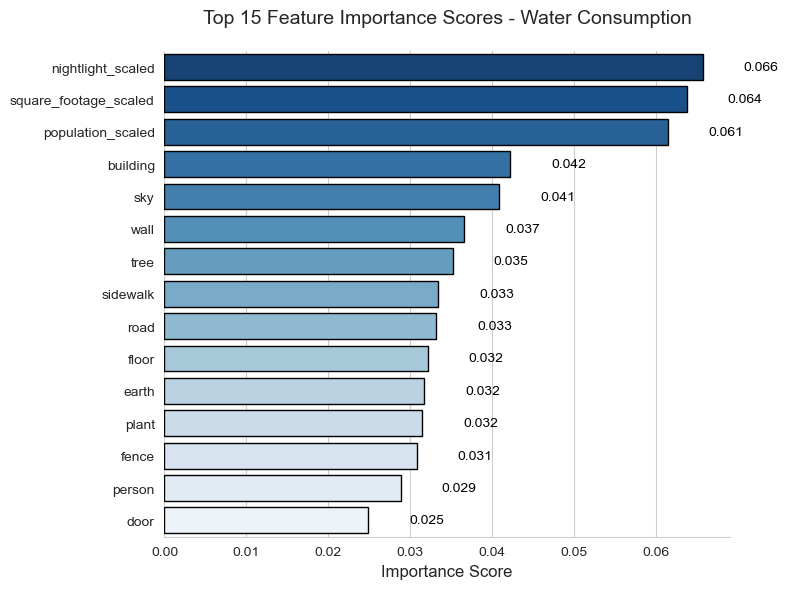

In [19]:
import seaborn as sns

# Set style
sns.set_style("whitegrid")
plt.figure(figsize=(8, 6))

# Get top 15 features
top_features = lgb_feature_importance_df.nlargest(15, 'Importance')

# Create barplot
ax = sns.barplot(x='Importance', y='Feature', data=top_features, 
                palette="Blues_r", edgecolor='black')

# Add data labels
for i, (importance, feature) in enumerate(zip(top_features['Importance'], top_features['Feature'])):
    ax.text(importance + 0.005, i, f"{importance:.3f}", 
           va='center', fontsize=10, color='black')

# Customize appearance
plt.title('Top 15 Feature Importance Scores - Water Consumption', fontsize=14, pad=20)
plt.xlabel('Importance Score', fontsize=12)
plt.ylabel('')
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
sns.despine(left=True)

# Adjust layout
plt.tight_layout()
plt.show()

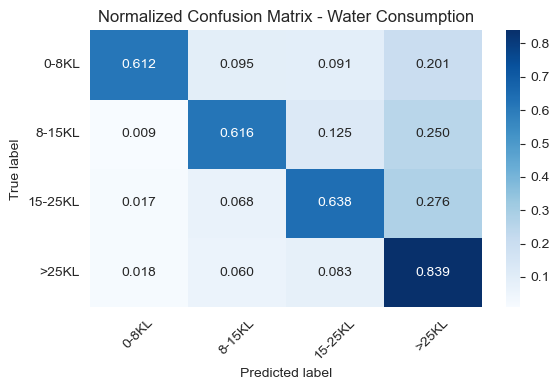

In [22]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, accuracy_score

# Use your best-tuned model (from GridSearchCV)
best_ordinal_lgb = grid_search.best_estimator_

# Predict on the original (unbalanced) training data
X_train, y_train = features_combined, train_labels
y_train_pred = best_ordinal_lgb.predict(X_train)

# Compute normalized confusion matrix
cm = confusion_matrix(y_train, y_train_pred, normalize='true')

# Plot using seaborn heatmap with color bar of same height
fig, ax = plt.subplots(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt=".3f", cmap='Blues', xticklabels=labels, yticklabels=labels,
            cbar_kws={"shrink": 1.0}, ax=ax)

# Keep x and y tick labels horizontal
ax.set_xticklabels(labels, rotation=45)
ax.set_yticklabels(labels, rotation=0)

plt.title("Normalized Confusion Matrix - Water Consumption")
plt.xlabel("Predicted label")
plt.ylabel("True label")
plt.tight_layout()
plt.show()


In [15]:
# Overall accuracy
overall_accuracy = accuracy_score(y_train, y_train_orig_pred)
print(f"Overall Accuracy: {overall_accuracy:.4f}")

# Per-class accuracy: diagonal / row sum
class_accuracies = np.diag(cm) / cm.sum(axis=1)
for i, label in enumerate(labels):
    print(f"Accuracy for {label}: {class_accuracies[i]:.4f}")

Overall Accuracy: 0.7283
Accuracy for 0-8KL: 0.6125
Accuracy for 8-15KL: 0.6158
Accuracy for 15-25KL: 0.6384
Accuracy for >25KL: 0.8389


In [16]:
# Create DataFrame with original training data and predictions
full_train_df = train_df.copy()  # original dataframe before SMOTE
full_train_df['True'] = y_train
full_train_df['Predicted'] = y_train_orig_pred

# Filter misclassified samples
misclassified = full_train_df[full_train_df['True'] != full_train_df['Predicted']]

# Report misclassification summary
total = len(full_train_df)
mis = len(misclassified)
print(f"Total misclassified samples: {mis}/{total} ({mis/total:.1%})")

# Optional: focus on important features to inspect
# Examine specific misclassification cases
features_to_analyze = ['nightlight', 'building_square_footage', 'population', 'building', 'sky', 'wall', 'tree', 'sidewalk', 'road', 'floor', 'earth', 'plant', 'fence', 'person', 'door']

Total misclassified samples: 4150/15273 (27.2%)


In [17]:
misclassified[['sl_no', 'True', 'Predicted'] + features_to_analyze].head(16)

,sl_no,True,Predicted,nightlight,building_square_footage,population,building,sky,wall,tree,sidewalk,road,floor,earth,plant,fence,person,door
3,5404,3,2,22.389126,106.031387,71.127968,0.067321,0.102083,0.145767,0.140296,0.010313,0.011679,0.086408,0.017825,0.028033,0.013383,0.000000,0.000000
5,1069,2,3,45.294243,290.279648,19.023371,0.301262,0.011025,0.152633,0.297413,0.092492,0.013896,0.000000,0.033529,0.078217,0.000000,0.000000,0.000000
6,511,2,3,17.922367,96.548373,70.439598,0.489592,0.021096,0.140796,0.121421,0.000000,0.000000,0.000000,0.000000,0.000621,0.000000,0.000000,0.000000
8,68541,2,3,36.548271,275.364685,13.760816,0.583125,0.151792,0.078817,0.050588,0.000000,0.000000,0.000000,0.114029,0.012363,0.008779,0.000000,0.000000
9,44709,2,3,25.177479,95.258919,149.463318,0.176896,0.133608,0.180533,0.227896,0.050487,0.072212,0.000000,0.000000,0.131538,0.000000,0.000000,0.000000
13,7161,1,2,31.587027,161.271072,99.440010,0.368508,0.099108,0.022479,0.003333,0.000000,0.008829,0.022125,0.027742,0.034292,0.000050,0.000642,0.000212
15,197448,2,3,38.091873,142.720154,145.424469,0.457663,0.074092,0.128800,0.225408,0.000000,0.000000,0.000000,0.066821,0.000000,0.000000,0.000000,0.000000
16,68898,3,2,34.794758,102.968018,16.044399,0.660725,0.049771,0.000000,0.074396,0.043904,0.111892,0.000567,0.000546,0.000000,0.000179,0.000000,0.018758
18,176659,2,3,47.126431,383.224976,15.260124,0.341808,0.193783,0.135708,0.081554,0.005587,0.000000,0.168971,0.000000,0.017100,0.000629,0.000000,0.000146
22,153275,3,2,44.479015,49.543803,15.919366,0.527008,0.020975,0.127112,0.058700,0.128867,0.000000,0.082467,0.000000,0.032613,0.000000,0.000000,0.000000


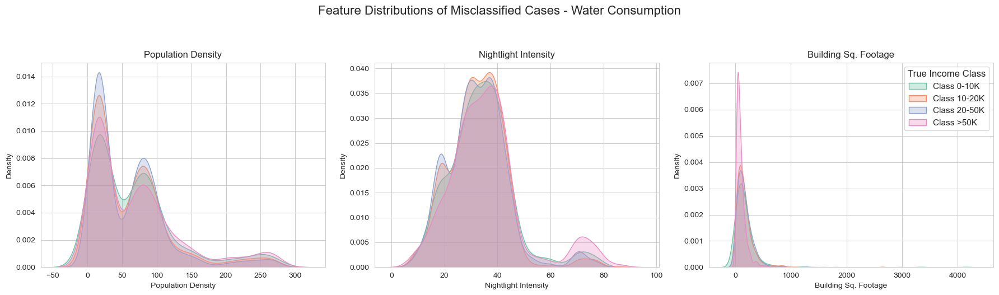

In [23]:
# Misclassified cases by key features
# Step 1: Create a copy and map labels
label_map = {
    0: 'Class 0-10K',
    1: 'Class 10-20K',
    2: 'Class 20-50K',
    3: 'Class >50K'
}

misclassified = misclassified.copy()
misclassified['True_Label'] = misclassified['True'].map(label_map)

# Step 2: Plot settings
features = ['population', 'nightlight', 'building_square_footage']
titles = ['Population Density', 'Nightlight Intensity', 'Building Sq. Footage']
palette = sns.color_palette('Set2', n_colors=4)
hue_order = ['Class 0-10K', 'Class 10-20K', 'Class 20-50K', 'Class >50K']

fig, axes = plt.subplots(1, 3, figsize=(18, 5))
sns.set(style="whitegrid")

for i, (feat, title) in enumerate(zip(features, titles)):
    ax = axes[i]
    for hue_val, color in zip(hue_order, palette):
        subset = misclassified[misclassified['True_Label'] == hue_val]
        sns.kdeplot(
            data=subset,
            x=feat,
            fill=True,
            label=hue_val if i == 2 else None,  # Show label ONLY on third plot
            common_norm=False,
            alpha=0.3,
            color=color,
            ax=ax
        )
    ax.set_title(title)
    ax.set_xlabel(title)
    ax.set_ylabel('Density')
    if i == 2:
        ax.legend(title='True Income Class')
    else:
        legend = ax.get_legend()
        if legend is not None:
            legend.remove()

plt.suptitle('Feature Distributions of Misclassified Cases - Water Consumption', fontsize=16, y=1.05)
plt.tight_layout()
plt.show()



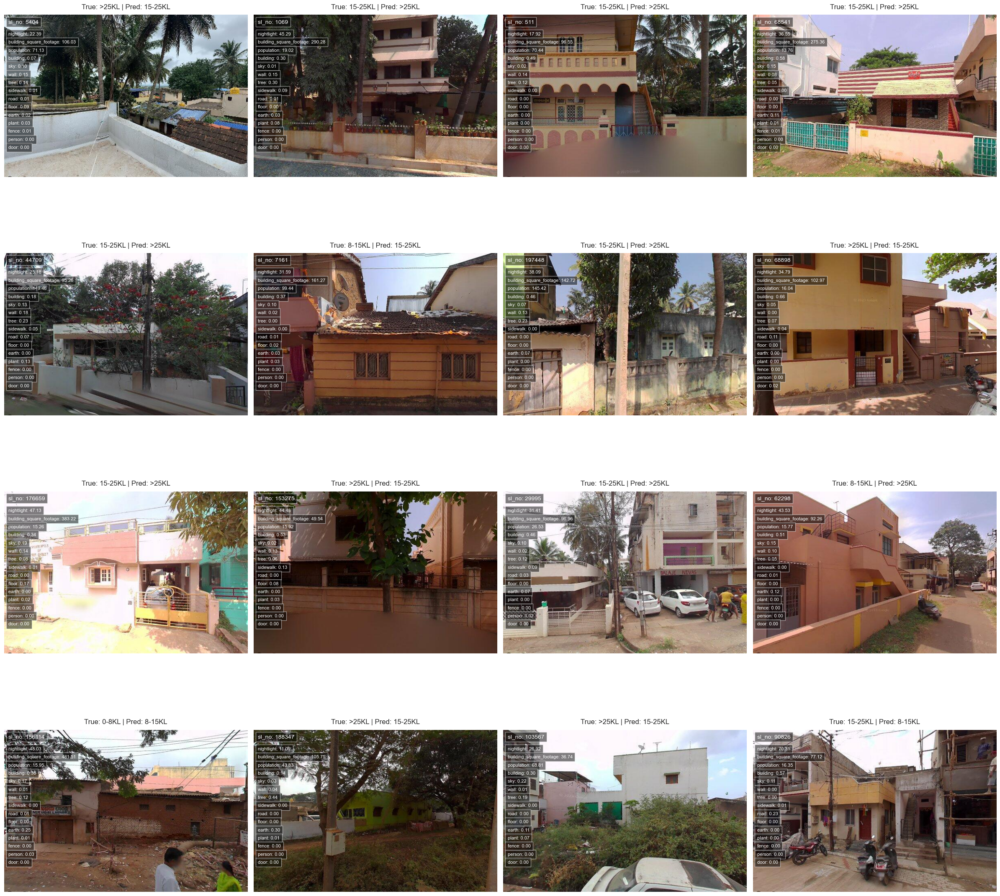

In [18]:
from PIL import Image

# Configuration
image_folder_path = "../data/raw/Hubballi_Original"
label_mapping = {'0-8KL': 0, '8-15KL': 1, '15-25KL': 2, '>25KL': 3}
reverse_label_mapping = {v: k for k, v in label_mapping.items()}
np.random.seed(42)

# Get top 15 important features
top_15_features = features_to_analyze

# Randomly select 16 misclassified cases (4x4 grid)
sample_misclassified = misclassified.head(16)

# Create figure with 4 columns and 4 rows
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.ravel()

for idx, (_, row) in enumerate(sample_misclassified.iterrows()):
    ax = axes[idx]
    
    # Load and display image
    image_path = os.path.join(image_folder_path, row['name'])
    try:
        img = Image.open(image_path)
        ax.imshow(img)
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        ax.axis('off')
        continue
    
    # Set title with true/predicted labels in your style
    true_label = reverse_label_mapping[row['True']]
    pred_label = reverse_label_mapping[row['Predicted']]
    ax.set_title(f"True: {true_label} | Pred: {pred_label}", fontsize=12, pad=10)
    
    # Add sl_no in top-left corner 
    ax.text(10, 20, f"sl_no: {row['sl_no']}", color='white', fontsize=10,
           bbox=dict(facecolor='black', alpha=0.5))
    
    # Add feature percentages in top-left with 2 decimal places
    for j, feature in enumerate(top_15_features):
        if feature in row:
            # Format the value to show 2 decimal places
            formatted_value = f"{float(row[feature]):.2f}"
            ax.text(10, 50 + j*20, f"{feature}: {formatted_value}", 
                   color='white', fontsize=8,
                   bbox=dict(facecolor='black', alpha=0.5))
    
    ax.axis('off')

# Hide any unused axes
for idx in range(len(sample_misclassified), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()

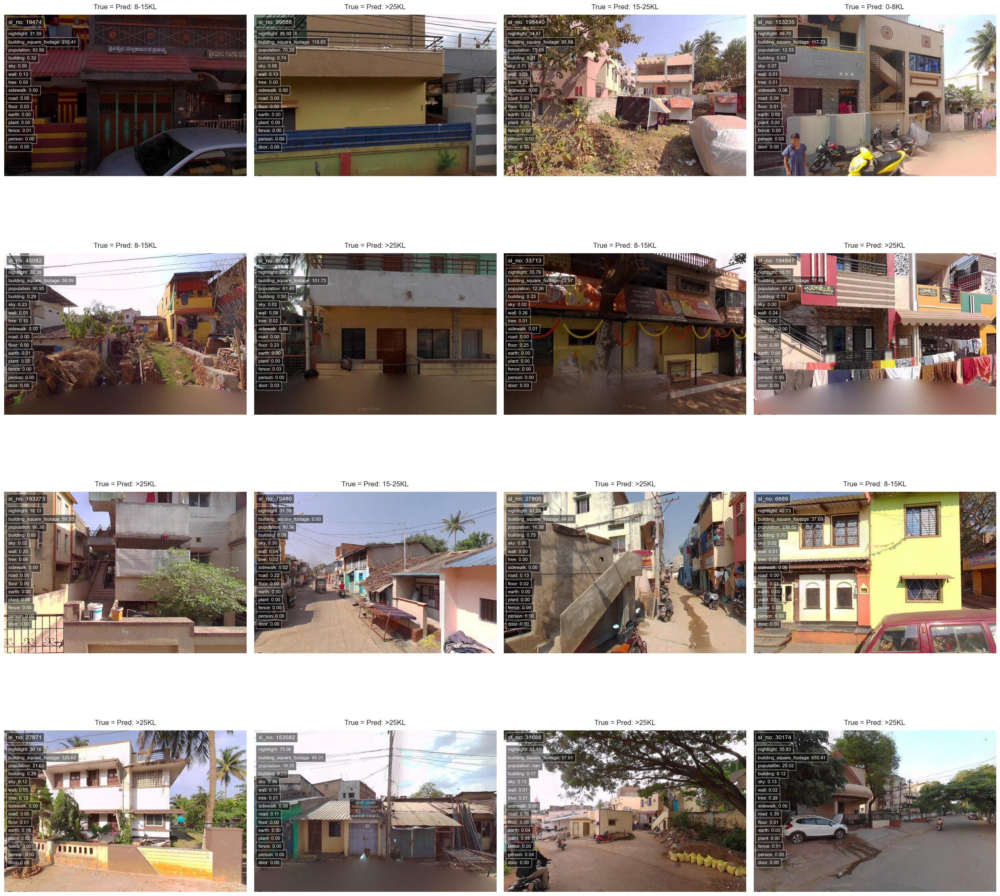

In [24]:
# Filter correctly classified samples
correct_classified = full_train_df[full_train_df['True'] == full_train_df['Predicted']]

# Randomly select 16 correctly classified cases
sample_correct = correct_classified.sample(n=16, random_state=42)

# Create figure with 4 columns and 4 rows
fig, axes = plt.subplots(4, 4, figsize=(24, 24))
axes = axes.ravel()

for idx, (_, row) in enumerate(sample_correct.iterrows()):
    ax = axes[idx]
    
    # Load and display image
    image_path = os.path.join(image_folder_path, row['name'])
    try:
        img = Image.open(image_path)
        ax.imshow(img)
    except Exception as e:
        print(f"Error loading image {image_path}: {e}")
        ax.axis('off')
        continue
    
    # Set title
    label = reverse_label_mapping[row['True']]
    ax.set_title(f"True = Pred: {label}", fontsize=12, pad=10)
    
    # Add sl_no in top-left corner 
    ax.text(10, 20, f"sl_no: {row['sl_no']}", color='white', fontsize=10,
           bbox=dict(facecolor='black', alpha=0.5))
    
    # Add feature percentages
    for j, feature in enumerate(top_15_features):
        if feature in row:
            formatted_value = f"{float(row[feature]):.2f}"
            ax.text(10, 50 + j*20, f"{feature}: {formatted_value}", 
                   color='white', fontsize=8,
                   bbox=dict(facecolor='black', alpha=0.5))
    
    ax.axis('off')

# Hide any unused axes
for idx in range(len(sample_correct), len(axes)):
    axes[idx].axis('off')

plt.tight_layout()
plt.show()
